# Computer Vision - Assignment 2 - Deep Learning for Computer Vision

#### 10 points   |   Due date: November 26, 23:59   |   Submission site: https://pradogrado2324.ugr.es/

### Student's Full Name: <mark>Juan Manuel Rodríguez Gómez</mark>

The goal of this assignment is to learn how to implement and use Convolutional Neural Networks using the fastai library (https://docs.fast.ai/).

In [2]:
# The first thing we should do is to apply hardware acceleration via GPU. So, we have to go to Editar - Configuracion del Cuaderno - Acelerador por Hardware GPU

# Now we SET UP Fastai
!pip install -Uqq fastbook
!pip install nbdev
import fastbook
fastbook.setup_book()
import fastai
import fastcore
print(f'fastcore version {fastcore.__version__} installed')
print(f'fastai version {fastai.__version__} installed')
from nbdev.showdoc import *
from fastai.vision.all import *

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.1/66.1 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 8.8 MB/s eta 0:00:00
Mounted at /content/gdrive
fastcore version 1.5.29 installed
fastai version 2.7.13 installed


In [3]:
# Function to display evaluation metrics

@patch
@delegates(subplots)
def plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    names = self.metric_names[1:-1]
    n = len(names) - 1
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None: nrows = int(np.ceil(n / ncols))
    elif ncols is None: ncols = int(np.ceil(n / nrows))
    figsize = figsize or (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize, **kwargs)
    axs = [ax if i < n else ax.set_axis_off() for i, ax in enumerate(axs.flatten())][:n]
    for i, (name, ax) in enumerate(zip(names, [axs[0]] + axs)):
        ax.plot(metrics[:, i], color='#1f77b4' if i == 0 else '#ff7f0e', label='valid' if i > 0 else 'train')
        ax.set_title(name if i > 1 else 'losses')
        ax.legend(loc='best')
    plt.show()



---



---



---



# <font color='blue'>**Exercise  3: Model transfer and fine-tuning with ResNet18 for the Caltech-UCSD Birds-200-2011 database (3.5 points)**
<font color='blue'>In this exercise we will work with the Caltech-UCSD Birds-200-2011 dataset (https://www.vision.caltech.edu/datasets/cub_200_2011/). This dataset consists of 11,788 images of 200 bird species. It has 200 classes, with 5,994 for training and 5,794 for testing. Again, 10% of the training set will be left for validation. Read the dataset using the provided functions.

<font color='blue'>We will use the ResNet18 network model already pre-trained with ImageNet, it can be downloaded from the fastai Model repository. You have to compare the performance of the following models and training strategies:

<font color='blue'>1. Use ResNet18 as a feature extractor for the Caltech-UCSD Birds-200-2011 dataset under three different scenarios:

>  <font color='blue'>1.1. Remove the final fully-connected (FC) layer of ResNet18, replace it by a FC layer of the dimensionality of the new problem, and train the new weights of this FC layer (while keeping frozen the remaining weights in the network).

> <font color='blue'>1.2. Instead of a single FC layer, employ the head introduced by default in fastai (see https://wandb.ai/capecape/imagenette_timm/reports/Checking-Out-the-New-fastai-timm-Integration--VmlldzoxOTMzNzMw and https://docs.fast.ai/vision.learner.html#head-and-model). Train these new weights (while keeping frozen the remaining weights in the network).

> <font color='blue'>1.3. Create your own head, combining all types of blocks you want (convolutional, FC layers,...). Train all these new weights (while keeping frozen the remaining weight in the network).

<font color='blue'>2. Make a fine-tuning of the entire ResNet18 network. Remember that the number of epochs for fine-tuning must be small.

<font color='blue'>3. Train from scratch the entire ResNet18 network. Remember that the number of epochs for fine-tuning must be VERY small.





---



---



---

First, we need to read the data from the URL

In [4]:
# https://docs.fast.ai/data.external.html
path = untar_data(URLs.CUB_200_2011)

In [5]:
print(path)
print(path.ls())
print((path/'CUB_200_2011/').ls())
train_test_split = np.loadtxt('/root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt',dtype=int)
# !cat /root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt

print('Number of testing examples: ', (train_test_split[:,1]== 0).sum())
print('Number of training examples: ', (train_test_split[:,1]== 1).sum())
print(train_test_split)


/root/.fastai/data/CUB_200_2011
[Path('/root/.fastai/data/CUB_200_2011/attributes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011')]
[Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/README'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/image_class_labels.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/bounding_boxes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/attributes'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/classes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/parts')]
Number of testing examples:  5794
Number of training examples:  5994
[[    1     0]
 [    2     1]
 [    3     0]
 ...
 [11786     0]
 [11787     1]
 [11788     0]]


In [6]:
with open('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images.txt') as file:
    images_list = file.readlines()
    images_list = [line.rstrip() for line in images_list]
print(images_list)

['1 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg', '2 001.Black_footed_Albatross/Black_Footed_Albatross_0009_34.jpg', '3 001.Black_footed_Albatross/Black_Footed_Albatross_0002_55.jpg', '4 001.Black_footed_Albatross/Black_Footed_Albatross_0074_59.jpg', '5 001.Black_footed_Albatross/Black_Footed_Albatross_0014_89.jpg', '6 001.Black_footed_Albatross/Black_Footed_Albatross_0085_92.jpg', '7 001.Black_footed_Albatross/Black_Footed_Albatross_0031_100.jpg', '8 001.Black_footed_Albatross/Black_Footed_Albatross_0051_796103.jpg', '9 001.Black_footed_Albatross/Black_Footed_Albatross_0010_796097.jpg', '10 001.Black_footed_Albatross/Black_Footed_Albatross_0025_796057.jpg', '11 001.Black_footed_Albatross/Black_Footed_Albatross_0023_796059.jpg', '12 001.Black_footed_Albatross/Black_Footed_Albatross_0086_796062.jpg', '13 001.Black_footed_Albatross/Black_Footed_Albatross_0049_796063.jpg', '14 001.Black_footed_Albatross/Black_Footed_Albatross_0006_796065.jpg', '15 001.Black_footed_Albatr

In [7]:
classes = (path/'CUB_200_2011/images/').ls()
print('Number of examples per class')
for i in range(len(classes)):
  print(len(classes[i].ls()), end=" ")


Number of examples per class
60 60 60 60 60 60 58 60 56 59 60 60 60 60 60 60 60 60 60 59 60 60 59 60 50 58 60 60 60 59 60 60 48 60 57 60 59 60 60 45 60 60 60 60 60 59 50 60 60 60 58 60 58 60 60 60 60 60 60 41 60 60 60 60 59 59 60 60 60 60 56 60 60 60 60 59 60 60 60 58 60 60 60 59 60 60 60 60 60 50 60 60 60 60 60 60 59 60 60 60 59 60 60 59 52 60 60 59 60 59 60 59 60 59 60 60 60 60 59 60 60 60 60 59 59 60 50 60 60 60 51 60 60 60 60 60 44 60 60 59 53 60 49 60 58 60 60 60 60 60 60 57 60 60 59 59 60 60 60 60 60 60 59 60 60 60 60 60 60 59 60 60 53 60 60 59 60 60 59 60 59 59 59 60 60 60 60 60 60 60 60 60 60 60 56 60 60 60 53 59 

In [8]:
# Now we have in images_list the list with all the images, and in train_test_split which ones belong to training (1) or test (0)
# We are going to create two folders: one train and another test, and we are going to put the corresponding images inside
print(path)
import shutil, os
if os.path.isdir('/root/.fastai/data/CUB_200_2011/train'):
  shutil.rmtree('/root/.fastai/data/CUB_200_2011/train')
if os.path.isdir('/root/.fastai/data/CUB_200_2011/test'):
  shutil.rmtree('/root/.fastai/data/CUB_200_2011/test')

shutil.copytree('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images','/root/.fastai/data/CUB_200_2011/train')
shutil.copytree('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images','/root/.fastai/data/CUB_200_2011/test')


/root/.fastai/data/CUB_200_2011


'/root/.fastai/data/CUB_200_2011/test'

In [9]:
print((path/'train').ls())
print(len((path/'train').ls()))

[Path('/root/.fastai/data/CUB_200_2011/train/102.Western_Wood_Pewee'), Path('/root/.fastai/data/CUB_200_2011/train/165.Chestnut_sided_Warbler'), Path('/root/.fastai/data/CUB_200_2011/train/047.American_Goldfinch'), Path('/root/.fastai/data/CUB_200_2011/train/046.Gadwall'), Path('/root/.fastai/data/CUB_200_2011/train/138.Tree_Swallow'), Path('/root/.fastai/data/CUB_200_2011/train/044.Frigatebird'), Path('/root/.fastai/data/CUB_200_2011/train/003.Sooty_Albatross'), Path('/root/.fastai/data/CUB_200_2011/train/174.Palm_Warbler'), Path('/root/.fastai/data/CUB_200_2011/train/022.Chuck_will_Widow'), Path('/root/.fastai/data/CUB_200_2011/train/196.House_Wren'), Path('/root/.fastai/data/CUB_200_2011/train/199.Winter_Wren'), Path('/root/.fastai/data/CUB_200_2011/train/038.Great_Crested_Flycatcher'), Path('/root/.fastai/data/CUB_200_2011/train/093.Clark_Nutcracker'), Path('/root/.fastai/data/CUB_200_2011/train/045.Northern_Fulmar'), Path('/root/.fastai/data/CUB_200_2011/train/059.California_Gull'

In [10]:
import os
for i in range(len(train_test_split)):
    if train_test_split[i,1]==0: #test image
       os.remove(path/'train'/images_list[i].rsplit(' ')[1]) #we remove it from train
    if train_test_split[i,1]==1: #train image
      os.remove(path/'test'/images_list[i].rsplit(' ')[1]) #we remove it from test

In [11]:
files_train = get_image_files(path/'train')
files_test = get_image_files(path/'test')
print('Total training images: ', len(files_train))
print('Total test images: ', len(files_test))


Total training images:  5994
Total test images:  5794


El conjunto de datos Caltech-UCSD Birds-200-2011 es una colección de imágenes de aves utilizado comúnmente en el campo de visión por computador para tareas de clasificación de imágenes. Algunos detalles clave sobre este dataset son los siguientes:

- Número de clases: Contiene un total de 200 clases diferentes. Cada clase representa una especie de ave única, y las imágenes están etiquetadas en consecuencia. Esto hace que el conjunto de datos sea adecuado para tareas de clasificación de imágenes en las que el objetivo es predecir la especie de ave presente en una imagen dada.

- Número total de imágenes: El conjunto de datos incluye 11,788 imágenes en total.

- División de conjuntos: Las imágenes están divididas en conjuntos de entrenamiento y prueba. En particular, hay 5,994 imágenes destinadas al conjunto de entrenamiento y 5,794 imágenes al conjunto de prueba.

[1] https://www.vision.caltech.edu/datasets/cub_200_2011/

In [12]:
# Definición del Datablock
CUB_200_2011_db = DataBlock(
                    blocks    = (ImageBlock, CategoryBlock),                                    # Definir el tipo de bloque de datos (Entradas del modelo: Imágenes | Salidas del modelo: Categorías)
                    get_items = get_image_files,                                                # Leer todas las imágenes en las subcarpetas de "path"
                    splitter  = RandomSplitter(valid_pct = 0.1, seed = 42),                     # Dividimos los datos aleatoriamente entre entrenamiento (90%) y validación (10%)
                    get_y     = parent_label,                                                   # Crear las etiquetas
                    item_tfms = Resize(224),                                                    # Nuestras imágenes tienen el mismo tamaño que las imágenes de ImageNet (el conjunto de datos en el que se entrenó previamente ResNet18)
                    batch_tfms = [IntToFloatTensor(), Normalize.from_stats(*imagenet_stats)]    # Normalizar los datos con las estadísticas de ImageNet
             )

# Definición del DataLoad para el conjunto de datos de entrenamiento y el conjunto de datos de validación
train_val_CUB_200_2011_dl = CUB_200_2011_db.dataloaders(path/'train', bs = 32)   # Crear el DataLoad a partir del DataBlock en batches con un tamaño de 32 imágenes

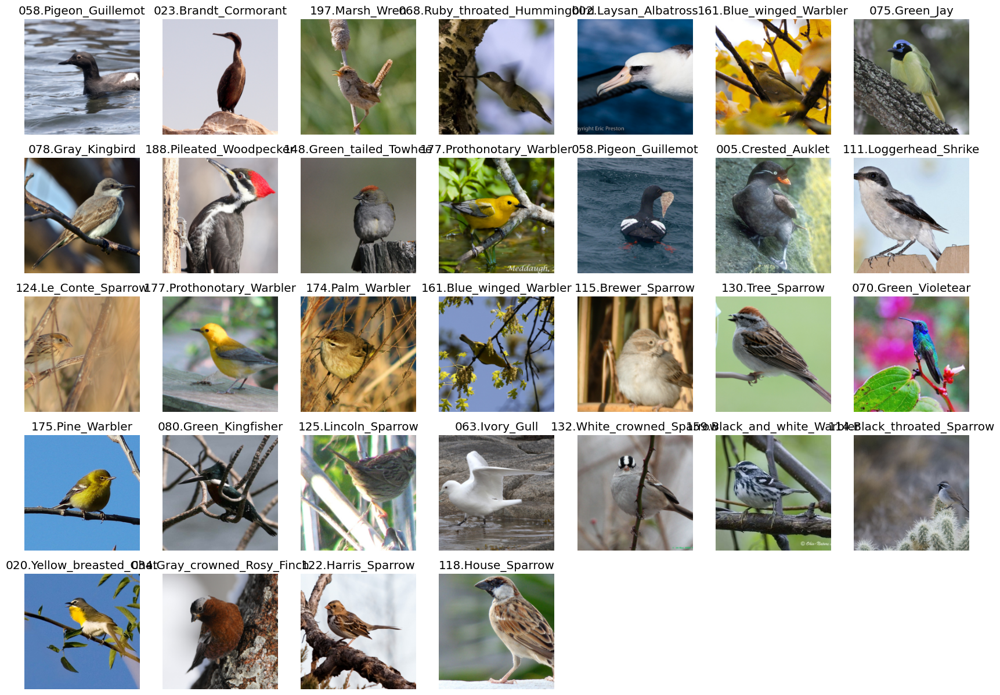

In [ ]:
# Muestra un batch de imágenes del conjunto de entrenamiento
train_val_CUB_200_2011_dl.train.show_batch(max_n = 32)

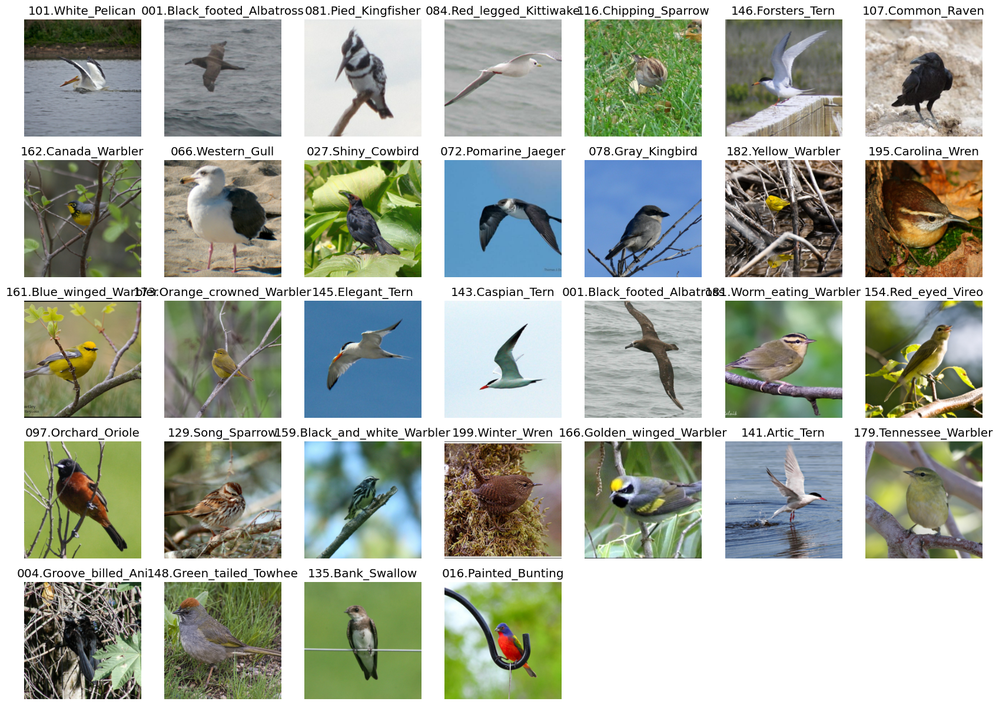

In [ ]:
# Muestra un batch de imágenes del conjunto de validación
train_val_CUB_200_2011_dl.valid.show_batch(max_n = 32)

In [13]:
# Número de clases del dataset Caltech-UCSD Birds-200-2011
num_classes = 200

ResNet18 es un modelo de red neuronal profunda que forma parte de la familia de arquitecturas ResNet (Residual Networks), desarrollada por Microsoft Research para abordar el problema del entrenamiento profundo. La arquitectura ResNet18 específica fue introducida en el artículo "Deep Residual Learning for Image Recognition" de Kaiming He, Xiangyu Zhang, Shaoqing Ren y Jian Sun, publicado en 2016:

[2] https://ieeexplore.ieee.org/document/7780459

Algunas características claves de ResNet18 son las siguientes:

- Bloques Residuales: La característica distintiva de ResNet es el uso de bloques residuales. Estos bloques permiten que la información fluya a través de la red de manera más eficiente mediante la introducción de conexiones de "salto" o conexiones residuales. La idea principal es que cada bloque aprende la diferencia entre la entrada y la salida, y esa diferencia se suma a la entrada original.

- Arquitectura básica: ResNet18 consta de 18 capas en total, de ahí su nombre. La estructura general incluye capas convolucionales, capas de normalización y activación (ReLU), bloques residuales y capas totalmente conectadas al final.

- Capas iniciales: Las primeras capas de ResNet18 incluyen una convolución inicial, seguida de una capa de normalización y una función de activación ReLU. También se utiliza una capa de agrupación máxima para reducir las dimensiones espaciales de las características.

- Bloques Residuales: ResNet18 utiliza bloques residuales básicos que contienen dos capas de convolución. Cada bloque tiene una estructura similar, con una capa de convolución seguida de normalización y ReLU, y otra capa de convolución. La salida de la segunda convolución se suma a la entrada original.

- Capas finales: Después de los bloques residuales, hay capas adicionales de convolución y una capa totalmente conectada al final. La capa de salida suele tener un número de neuronas igual al número de clases en la tarea de clasificación (en nuestro caso, dicho núemro de neuronas debe ser igual a 200).

- Tamaño de filtro: ResNet18 utiliza principalmente filtros de tamaño 3 x 3 en las capas convolucionales.

- Reducción de dimensiones: Se utiliza una capa de agrupación máxima para reducir las dimensiones espaciales en ciertos puntos de la red, lo que ayuda a mejorar la eficiencia computacional y a proporcionar una invarianza parcial a las traslaciones.

Los beneficios y contribuciones más destacados que aporta esta arquitectura son los siguientes:

- Alivio del problema de desvanecimiento del gradiente: La arquitectura ResNet ayuda a mitigar el problema de desvanecimiento del gradiente al permitir que la información fluya directamente a través de las conexiones residuales.

- Entrenamiento más profundo: ResNet permitió el entrenamiento de redes neuronales considerablemente más profundas que las arquitecturas anteriores, lo que llevó a una mejora significativa en la precisión de la clasificación de imágenes.

- Transferencia de aprendizaje (Transfer Learning): Dada su eficacia en la extracción de características, las arquitecturas ResNet, incluida ResNet18, se utilizan comúnmente como modelos preentrenados para tareas de visión por computador en diversas aplicaciones, tal y como veremos en este ejercicio.

In [14]:
# Mostrar la arquitectura de ResNet18 (FastAI ya proporciona un modelo preentrenado en ImageNet con ResNet18)
models.resnet18()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

En este caso, el "head" de la arquitectura ResNet18 está compuesto por la capa completamente conectada que tiene la siguiente configuración:

`(fc): Linear(in_features=512, out_features=1000, bias=True)`,

donde `in_features` representa la dimensionalidad de las características de entrada a la capa completamente conectada, que es 512 en este caso. Esto se debe a que la capa anterior a la capa completamente conectada es una capa de pooling adaptativo (`AdaptiveAvgPool2d(output_size=(1, 1))`), que reduce las dimensiones espaciales de las características a 1x1, pero mantiene 512 canales. Por otro lado, `out_features` representa la dimensionalidad de la salida de la capa completamente conectada, que es 1000 en este caso. Esto es común en arquitecturas preentrenadas de ResNet18, ya que originalmente se entrenaron en el conjunto de datos ImageNet que tiene 1000 clases.


En este apartado 3.1, usaremos ResNet18 como extractor de características, es decir, aprovecharemos las representaciones aprendidas por las capas convolucionales de ResNet18 en vez de utilizarlo como un clasificador completo. En lugar de utilizar todo el modelo para realizar predicciones, se retiran las capas finales que están específicamente diseñadas para la tarea de clasificación original y se utilizan las capas convolucionales previas para obtener representaciones de características de las imágenes de entrada.

El proceso de usar ResNet18 como extractor de características es el siguiente:

- Eliminar las capas de clasificación: Se eliminan las capas finales del modelo, que suelen incluir una o más capas totalmente conectadas destinadas a la clasificación de las características extraídas por las capas convolucionales.

- Obtener representaciones de características: Se toman las imágenes de entrada y se propagan hacia adelante a través de las capas convolucionales restantes de ResNet18. Estas capas convolucionales actúan como extractores de características, aprendiendo y extrayendo representaciones relevantes de las imágenes.

- Utilizar las representaciones para una nueva tarea: Se conecta un nuevo clasificador (un nuevo head, que puede ser una única capa totalmente conectada o una combinación de varios tipos de capas) al final de las capas convolucionales restantes. Este nuevo clasificador tiene una dimensionalidad adecuada para la tarea específica que se está abordando (en nuestro, la dimensionalidad sería el número de clases en el conjunto de datos de aves, es decir, 200 clases). Los pesos de este nuevo clasificador se inicializan aleatoriamente.

- Entrenar el nuevo clasificador: Se entrena únicamente el nuevo clasificador añadido, mientras se mantienen congeladas las ponderaciones de las capas convolucionales. El objetivo es ajustar el clasificador para que se adapte a la tarea específica utilizando las representaciones de características aprendidas por ResNet18.

Esto es particularmente útil en situaciones donde se dispone de conjuntos de datos más pequeños y se busca beneficiarse de las representaciones aprendidas en conjuntos de datos más grandes como ImageNet (como es nuestro caso).

## <font color='blue'> 3.1.1 Train single FC layer included in the head

La función principal de FastAI para todo este ejercicio 3 es `vision_learner(dls, arch)`. Esta función contiene todas las funcionalidades necesarias para construir un Learner adecuado para transfer learning en visión por computador. Aquí hay una descripción de los parámetros más importantes de la función `vision_learner(dls, arch)`:

- `dls`: Conjunto de datos de DataLoader para entrenamiento, validación y posiblemente pruebas.

- `arch`: Arquitectura del modelo que se utilizará. Puede ser una arquitectura predefinida (como es ResNet18 en nuestro caso) o una arquitectura personalizada.

- `n_out`: Número de salidas del modelo. Especifica la dimensionalidad de la capa de salida del modelo.

- `pretrained`: Booleano que indica si se deben utilizar pesos preentrenados en el modelo. Por defecto, `pretrained = True`.

- `loss_func`: Función de pérdida que se utilizará durante el entrenamiento.

- `opt_func`: Función de optimización que se utilizará para ajustar los pesos del modelo.

- `lr`: Tasa de aprendizaje inicial para el entrenamiento.

- `splitter`: Función opcional para personalizar cómo se dividen los parámetros del modelo en diferentes grupos durante el entrenamiento.

- `cbs`: Lista de devoluciones de llamada (callbacks) que se utilizarán durante el entrenamiento.

- `metrics`: Métricas que se utilizarán para evaluar el rendimiento del modelo.

- `train_bn`: Booleano que indica si se deben entrenar los parámetros de batch normalization.

- `cut`: Índice opcional para cortar la arquitectura. Útil para arquitecturas que tienen múltiples partes (por ejemplo, un extractor de características y un clasificador).

- `custom_head`: Capa personalizada que sustituirá al head original de la arquitectura.

Para más información, se puede consultar la siguiente documentación de FastAI:


[3] https://docs.fast.ai/vision.learner.html#vision_learner

Si le queremos añadir un nuevo head a la arquitectura ResNet18, simplemente tenemos que definir dicho head y pasarlo como parámetro a la función `vision_learner()` especificando `custom_head`.

En este apartado 3.1.1 se nos pide eliminar la capa final completamente conectada (FC) de ResNet18 y reemplazarla por una capa FC de la dimensionalidad del nuevo problema (200 neuronas como salida de la última capa FC). Una vez hecho esto, se pide también entrenar los nuevos pesos de esta capa FC (mientras se mantienen congelados los pesos restantes en la red).

Para mantener congelados pesos durante el entrenamiento de un modelo, FastAI proporciona las funciones `Learner.freeze()` y `Learner.freeze_to(n)` se utilizan para congelar los gradientes durante el entrenamiento de un modelo. Esta es una técnica esencial cuando se realiza transfer learning.

- `Learner.freeze()`: Se utiliza para congelar todas las capas del modelo excepto las capas finales, incluyendo las capas adicionales que podrían haberse agregado al modelo (por ejemplo, un nuevo clasificador).

- `Learner.freeze_to(n)`: Se utiliza para congelar todas las capas del modelo hasta la capa número n, excluyendo aquellas después de la capa n.

En nuestro caso, debido a alta funcionalidad que proporciona la función `vision_learner()` no tenemos que llamar explícitamente a estas funciones. La función `vision_learner()` congela todos los pesos de la red excepto los del head.

Por otro lado, los parámetros de las capas BatchNormalization siempre se adaptan por defecto por lo que, en caso de que no queramos adaptarlos (como es nuestro caso), tenemos que especificar `train_bn = False` en la función `vision_learner()`. Véase:

[4] https://stackoverflow.com/questions/63016740/why-its-necessary-to-frozen-all-inner-state-of-a-batch-normalization-layer-when

LEARNING RATE: 0.0006918309954926372 



epoch,train_loss,valid_loss,accuracy,time
0,5.561365,5.235701,0.020033,00:36
1,4.214128,3.796271,0.180301,00:36
2,3.123796,3.047116,0.307179,00:37
3,2.536683,2.733782,0.353923,00:36
4,2.245621,2.588531,0.392321,00:37
5,2.116170,2.571837,0.393990,00:36


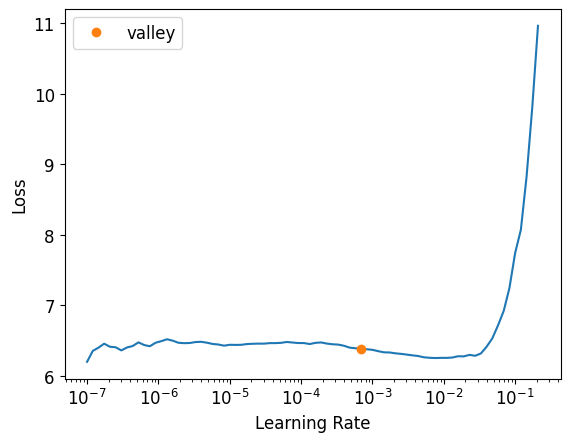

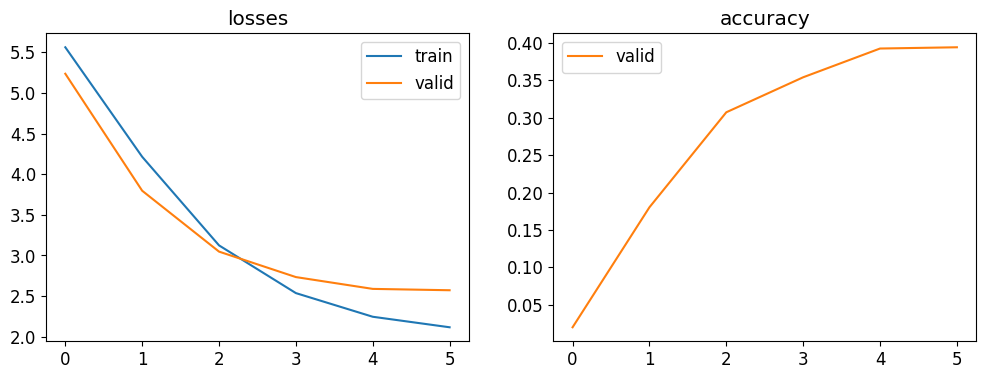


ACCURACY POR ÉPOCA en el conjunto VALIDATION:

	ÉPOCA 0 :  2.0033 %

	ÉPOCA 1 :  18.0301 %

	ÉPOCA 2 :  30.7179 %

	ÉPOCA 3 :  35.3923 %

	ÉPOCA 4 :  39.2321 %

	ÉPOCA 5 :  39.399 %

ACCURACY en el conjunto VALIDATION:  39.399 %



Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        False     
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                      

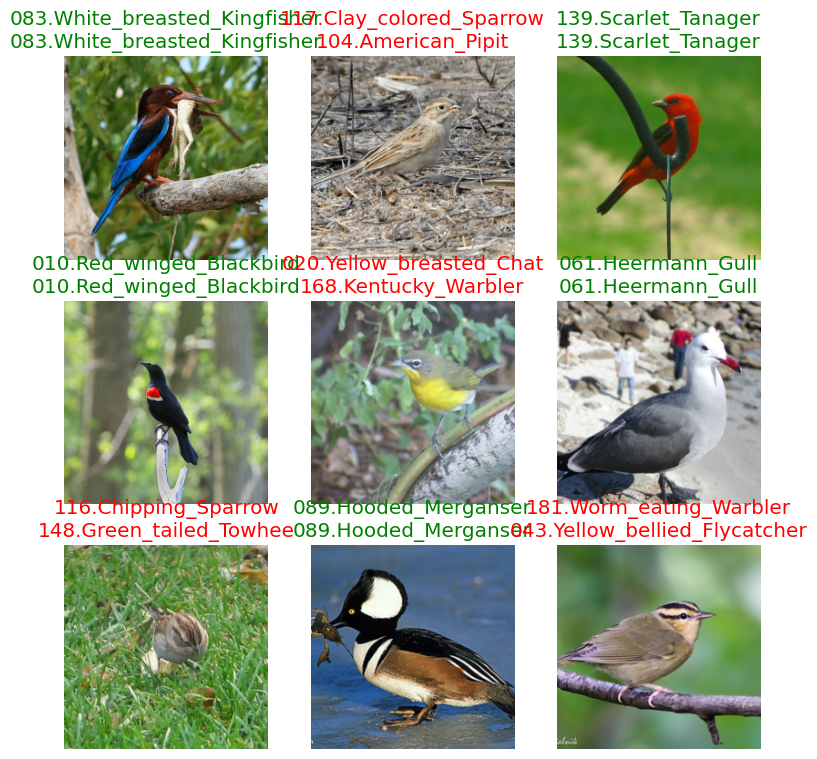

In [ ]:
# Nuevo head (capa fully-connected con dimensionalidad adaptada a nuestro problema)
custom_head = sequential(
    nn.AdaptiveAvgPool2d(output_size = (1, 1)),                 # Esta capa de la arquitectura original de ResNet18 también la elimina la función vision_learner(), por lo que la mantenemos en el nuevo head
    nn.Flatten(),                                               # Capa para pasar de tensor tridimensional a tensor unidimensional (vector 1D)
    nn.Linear(in_features = 512, out_features = num_classes)    # Capa fully-connected con dimensionalidad de salida adaptada a nuestro problema (200 clases)
)

# Objeto vision_learner (por defecto, pretrained = True)
learn = vision_learner(train_val_CUB_200_2011_dl, models.resnet18, loss_func = CrossEntropyLossFlat(), metrics = accuracy, train_bn = False, custom_head = custom_head)

# Encontrar el valor óptimo del learning rate (lr)
lr = learn.lr_find()
print(f'LEARNING RATE: {lr[0]} \n')

# Ejecutar el optimizador one-cycle
learn.fit_one_cycle(n_epoch = 6, lr_max = lr[0])

# Mostrar la curva de accuracy en validación a lo largo de las diferentes épocas
learn.recorder.plot_metrics()

# Accuracy en el conjunto de validación
final_metrics_val = learn.recorder.values[-1] # Últimos valores de las métricas almacenados en el historial

print('\nACCURACY POR ÉPOCA en el conjunto VALIDATION:')
for i in range(len(learn.recorder.values)):
  epoch_metrics_val = learn.recorder.values[i]           # Valores de las métricas en la época correspondiente
  epoch_acc_val = epoch_metrics_val[-1]                  # Accuracy en validación en la época correspondiente
  print('\n\tÉPOCA', i, ': ', round(float(epoch_acc_val) * 100, 4), '%')

final_acc_val = final_metrics_val[-1]                    # Accuracy en validación de la última época de entrenamiento

print('\nACCURACY en el conjunto VALIDATION: ', round(float(final_acc_val) * 100, 4), '%\n')

# Mostrar resultados tras el entrenamiento del modelo
learn.show_results()

# Mostrar todos los detalles del objeto vision_learner
learn.summary()

Como deciamos, la función `vision_learner()` congela todos los pesos de la red excepto los del head. Esto se puede observar en la columna `Trainable` de la tabla resumen del modelo proporcionada por la función `learn.summary()`, donde todas las capas están a False (significando que no se van a entrenar dichas capas, es decir, los pesos se mantienen congelados durante el entrenamiento) excepto el nuevo head que hemos proporcionado (en este caso, la capa fully-connected con dimensión de salida adaptada a nuestro problema de 200 clases diferentes), el cual está a True (significando que sí se va a entrenar dichas capas del head). Esto también se observa en la siguiente parte también proporcionada por `learn.summary()`:

`Total params: 11,279,112`

`Total trainable params: 102,600`

`Total non-trainable params: 11,176,512`

Como se puede observar, el número de parámetros entrenables es justo el número de parámetros de la capa fully-connected con dimensión de salida adaptada a nuestro problema que hemos proporcionado, mientras que el número de parámetros no entrenables son el resto de parámetros del modelo.

In [ ]:
# Generación de predicciones del modelo entrenado en el conjunto de entrenamiento
preds, targs, _ = learn.get_preds(dl = train_val_CUB_200_2011_dl.train, with_decoded = True)

# Accuracy en el conjunto de entrenamiento
acc_train = accuracy(preds, targs)
print('\nACCURACY en el conjunto TRAINING: ', round(float(acc_train) * 100, 4), '%')


ACCURACY en el conjunto TRAINING:  58.8879 %


In [ ]:
# Definición del DataLoad para el conjunto de datos de prueba (test)
test_CUB_200_2011_dl = learn.dls.test_dl(files_test, with_labels = True)

# Generación de predicciones del modelo entrenado en el conjunto de test
preds, targs, _ = learn.get_preds(dl = test_CUB_200_2011_dl, with_decoded = True)

# Accuracy en el conjunto de test
acc_test = accuracy(preds, targs)
print('\nACCURACY en el conjunto TEST: ', round(float(acc_test) * 100, 4), '%')


ACCURACY en el conjunto TEST:  40.145 %


Se probó también a mostrar la matriz de confusión, tal y como se hacía en los ejercicios 1 y 2 de esta práctica. Sin embargo, al haber 200 clases diferentes (en los ejercicios 1 y 2 había 25 clases diferentes), se obtenía una gráfica de la matriz de confusión en la que no se observaba nada claro, debido al alto número de clases (todo estaba muy pegado, sin poder deducirse nada a partir de dicha gráfica, por lo que no resulta útil).

## <font color='blue'> 3.1.2 Train head included by default in fastai

En este apartado, simplemente tenemos que llamar a la función `vision_learner()` (no es necesario llamar a la función `create_head()` de FastAI). Esto es así porque FastAI elimina el head de nuestro modelo original al llamar a la función `vision_learner()` e introduce otras capas con dimensiones adaptadas al problema representado por `dls` (introduce el head por defecto de FastAI). Específicamente, `vision_learner()` llama a `create_vision_model()` y sustituye el head original del modelo por el siguiente head (el de por defecto de FastAI):

    Sequential(
         (0): AdaptiveConcatPool2d(
              (ap): AdaptiveAvgPool2d(output_size=1)
              (mp): AdaptiveMaxPool2d(output_size=1)
         )
         (1): Flatten(full=False)
         (2): BatchNorm1d(768, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (3): Dropout(p=0.25, inplace=False)
         (4): Linear(in_features=768, out_features=512, bias=False)
         (5): ReLU(inplace=True)
         (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (7): Dropout(p=0.5, inplace=False)
         (8): Linear(in_features=512, out_features=num_clases_de_nuestro_problema (200 en nuestro caso), bias=False)
    )





En este head por defecto de FastAI podemos observar capas de pooling adaptativo, normalización por lotes, dropout y capas completamente conectadas con funciones de activación ReLU. La última capa lineal produce la salida final del modelo.

Pueden ser de utilidad los siguientes enlaces:

[5] https://docs.fast.ai/vision.learner.html#head-and-model

[6] https://wandb.ai/capecape/imagenette_timm/reports/Checking-Out-the-New-fastai-timm-Integration--VmlldzoxOTMzNzMw



LEARNING RATE: 0.0014454397605732083 



epoch,train_loss,valid_loss,accuracy,time
0,5.582764,3.469590,0.242070,00:39
1,3.269248,2.129951,0.464107,00:38
2,2.210517,1.842897,0.510851,00:39
3,1.658599,1.677822,0.555927,00:38
4,1.333648,1.657699,0.549249,00:48
5,1.174247,1.636070,0.557596,00:38


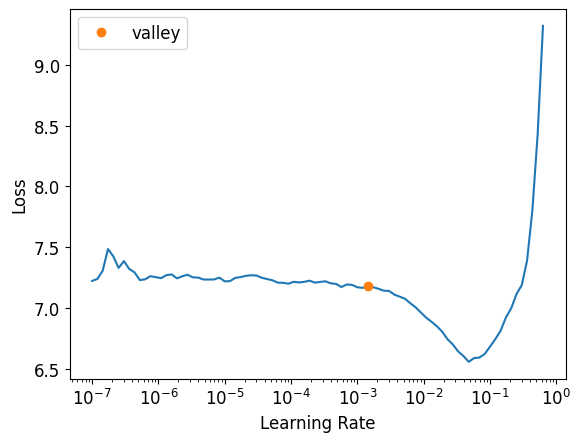

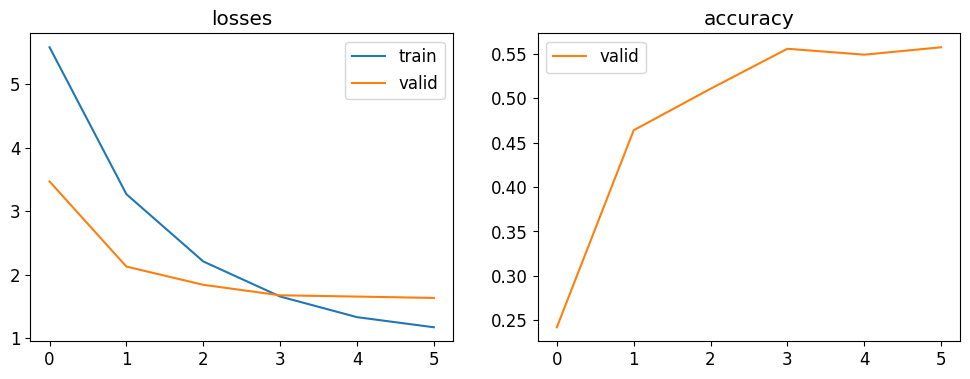


ACCURACY POR ÉPOCA en el conjunto VALIDATION:

	ÉPOCA 0 :  24.207 %

	ÉPOCA 1 :  46.4107 %

	ÉPOCA 2 :  51.0851 %

	ÉPOCA 3 :  55.5927 %

	ÉPOCA 4 :  54.9249 %

	ÉPOCA 5 :  55.7596 %

ACCURACY en el conjunto VALIDATION:  55.7596 %



Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        False     
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                      

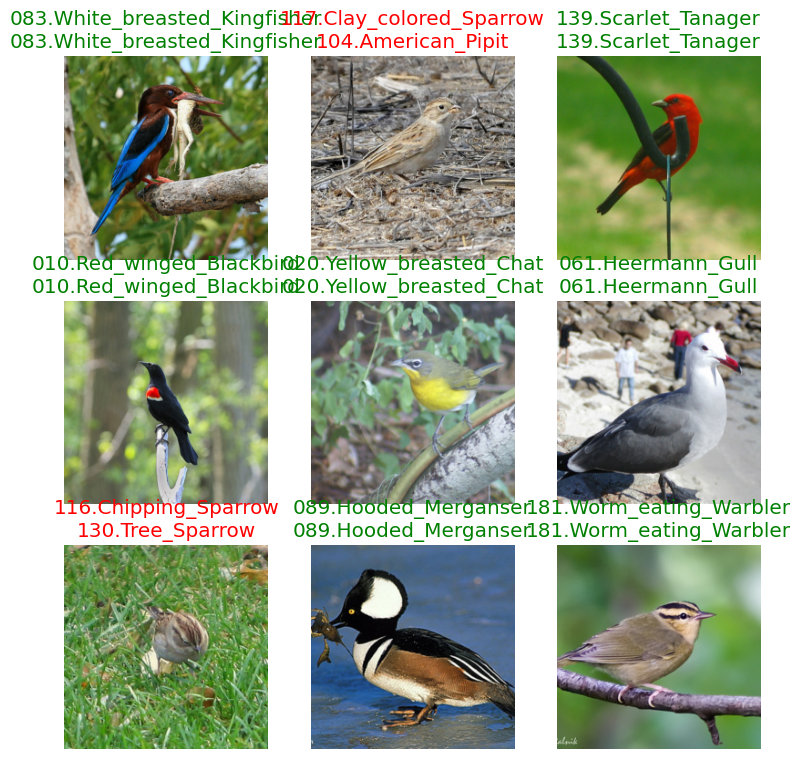

In [ ]:
# Objeto vision_learner (por defecto, pretrained = True. Automáticamente, se sustituye la última capa fully-connected de ResNet18 por el head por defecto de FastAI con dimensionalidad adaptada a nuestro problema)
learn = vision_learner(train_val_CUB_200_2011_dl, models.resnet18, loss_func = CrossEntropyLossFlat(), metrics = accuracy, train_bn = False)

# Encontrar el valor óptimo del learning rate (lr)
lr = learn.lr_find()
print(f'LEARNING RATE: {lr[0]} \n')

# Ejecutar el optimizador one-cycle
learn.fit_one_cycle(n_epoch = 6, lr_max = lr[0])

# Mostrar la curva de accuracy en validación a lo largo de las diferentes épocas
learn.recorder.plot_metrics()

# Accuracy en el conjunto de validación
final_metrics_val = learn.recorder.values[-1] # Últimos valores de las métricas almacenados en el historial

print('\nACCURACY POR ÉPOCA en el conjunto VALIDATION:')
for i in range(len(learn.recorder.values)):
  epoch_metrics_val = learn.recorder.values[i]           # Valores de las métricas en la época correspondiente
  epoch_acc_val = epoch_metrics_val[-1]                  # Accuracy en validación en la época correspondiente
  print('\n\tÉPOCA', i, ': ', round(float(epoch_acc_val) * 100, 4), '%')

final_acc_val = final_metrics_val[-1]                    # Accuracy en validación de la última época de entrenamiento

print('\nACCURACY en el conjunto VALIDATION: ', round(float(final_acc_val) * 100, 4), '%\n')

# Mostrar resultados tras el entrenamiento del modelo
learn.show_results()

# Mostrar todos los detalles del objeto vision_learner
learn.summary()

En el resumen del modelo proporcionado por `learn.summary()` se puede observar, tal y como se esperaba por lo explicado en 3.1.1, que los pesos de las capas que no son del head se mantienen congelados durante el entrenamiento.

De hecho, si mostramos el head proporcionado por la función `create_head(nf, n_out)` con la dimensionalidad adaptada a nuestro problema (`nf = 512`. `n_out = num_classes`), y lo comparamos con las capas del final del modelo mostradas en `learn.summary()` vemos que coinciden, lo cual corrobora lo que comentábamos de que la función `vision_learner()` añade este head por defecto de FastAI de forma automática.

In [18]:
default_head = create_head(512, num_classes)

default_head

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): fastai.layers.Flatten(full=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=False)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=200, bias=False)
)

In [ ]:
# Generación de predicciones del modelo entrenado en el conjunto de entrenamiento
preds, targs, _ = learn.get_preds(dl = train_val_CUB_200_2011_dl.train, with_decoded = True)

# Accuracy en el conjunto de entrenamiento
acc_train = accuracy(preds, targs)
print('\nACCURACY en el conjunto TRAINING: ', round(float(acc_train) * 100, 4), '%')


ACCURACY en el conjunto TRAINING:  90.5468 %


In [ ]:
# Definición del DataLoad para el conjunto de datos de prueba (test)
test_CUB_200_2011_dl = learn.dls.test_dl(files_test, with_labels = True)

# Generación de predicciones del modelo entrenado en el conjunto de test
preds, targs, _ = learn.get_preds(dl = test_CUB_200_2011_dl, with_decoded = True)

# Accuracy en el conjunto de test
acc_test = accuracy(preds, targs)
print('\nACCURACY en el conjunto TEST: ', round(float(acc_test) * 100, 4), '%')


ACCURACY en el conjunto TEST:  57.1971 %


Por el mismo motivo expuesto en 3.1.1, no mostramos la matriz de confusión.

## <font color='blue'> 3.1.3. Train new custom head (including convolutional layers, FC layers, etc.)

Finalmente, en este apartado tenemos que añadir un head al modelo creado por nosotros (no el que añade FastAI por defecto) combinando diferentes tipos de capas: convolucionales, fully-connected, etc. (no solo una capa fully-connected con la dimensionalidad adaptada a nuestro problema como hacíamos en 3.1.1). Siguiendo una lógica similar al ejercicio 2 de esta práctica, el nuevo head que añadimos es el que se muestra a continuación:

LEARNING RATE: 0.0010000000474974513 



epoch,train_loss,valid_loss,accuracy,time
0,3.991524,3.058589,0.278798,00:38
1,2.436266,2.143314,0.440735,00:44
2,1.640558,1.897047,0.482471,00:41
3,1.011147,1.760145,0.515860,00:38
4,0.543771,1.618441,0.557596,00:38
5,0.337225,1.593379,0.559265,00:38


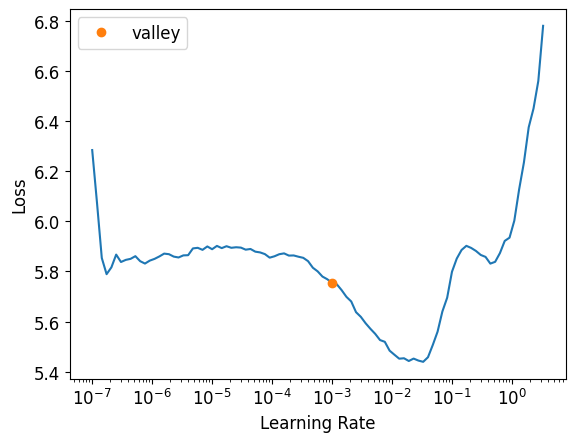

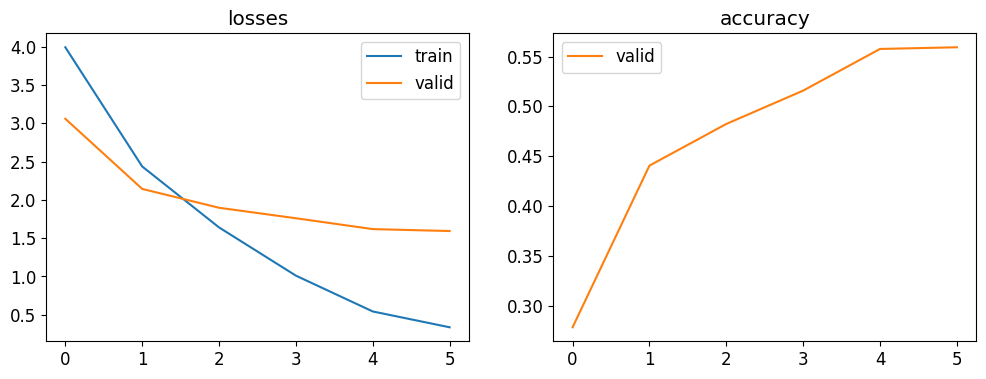


ACCURACY POR ÉPOCA en el conjunto VALIDATION:

	ÉPOCA 0 :  27.8798 %

	ÉPOCA 1 :  44.0735 %

	ÉPOCA 2 :  48.2471 %

	ÉPOCA 3 :  51.586 %

	ÉPOCA 4 :  55.7596 %

	ÉPOCA 5 :  55.9265 %

ACCURACY en el conjunto VALIDATION:  55.9265 %



Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        False     
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                      

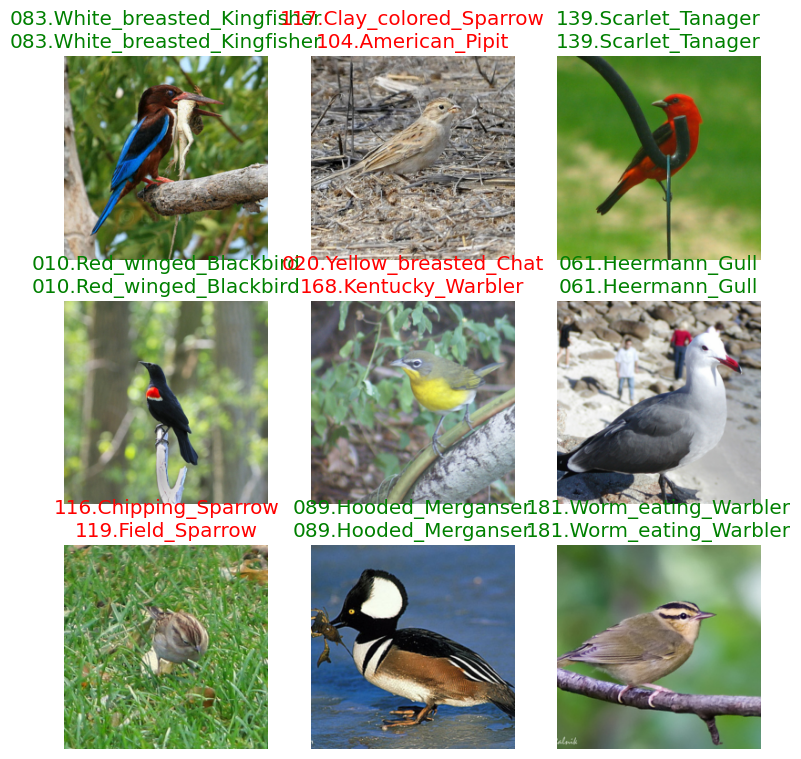

In [ ]:
# Nuevo head (combinación de varios tipos de capas con dimensionalidad adaptada a nuestro problema)
custom_head = sequential(
    nn.AdaptiveAvgPool2d(output_size = (1, 1)),
    nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = (3, 3), padding = 1),
    nn.BatchNorm2d(num_features = 1024),
    nn.ReLU(),
    nn.Conv2d(in_channels = 1024, out_channels = 1024, kernel_size = (3, 3), padding = 1),
    nn.BatchNorm2d(num_features = 1024),
    nn.ReLU(),
    nn.Flatten(),
    nn.Linear(in_features = 1024, out_features = 512),
    nn.BatchNorm1d(num_features = 512),
    nn.Dropout(p = 0.25),
    nn.ReLU(),
    nn.Linear(in_features = 512, out_features = num_classes)
)

# Objeto vision_learner (por defecto, pretrained = True)
learn = vision_learner(train_val_CUB_200_2011_dl, models.resnet18, loss_func = CrossEntropyLossFlat(), metrics = accuracy, train_bn = False, custom_head = custom_head)

# Encontrar el valor óptimo del learning rate (lr)
lr = learn.lr_find()
print(f'LEARNING RATE: {lr[0]} \n')

# Ejecutar el optimizador one-cycle
learn.fit_one_cycle(n_epoch = 6, lr_max = lr[0])

# Mostrar la curva de accuracy en validación a lo largo de las diferentes épocas
learn.recorder.plot_metrics()

# Accuracy en el conjunto de validación
final_metrics_val = learn.recorder.values[-1] # Últimos valores de las métricas almacenados en el historial

print('\nACCURACY POR ÉPOCA en el conjunto VALIDATION:')
for i in range(len(learn.recorder.values)):
  epoch_metrics_val = learn.recorder.values[i]           # Valores de las métricas en la época correspondiente
  epoch_acc_val = epoch_metrics_val[-1]                  # Accuracy en validación en la época correspondiente
  print('\n\tÉPOCA', i, ': ', round(float(epoch_acc_val) * 100, 4), '%')

final_acc_val = final_metrics_val[-1]                    # Accuracy en validación de la última época de entrenamiento

print('\nACCURACY en el conjunto VALIDATION: ', round(float(final_acc_val) * 100, 4), '%\n')

# Mostrar resultados tras el entrenamiento del modelo
learn.show_results()

# Mostrar todos los detalles del objeto vision_learner
learn.summary()

En el resumen del modelo proporcionado por `learn.summary()` se puede observar, tal y como se esperaba por lo explicado en 3.1.1, que los pesos de las capas que no son del head se mantienen congelados durante el entrenamiento.

In [ ]:
# Generación de predicciones del modelo entrenado en el conjunto de entrenamiento
preds, targs, _ = learn.get_preds(dl = train_val_CUB_200_2011_dl.train, with_decoded = True)

# Accuracy en el conjunto de entrenamiento
acc_train = accuracy(preds, targs)
print('\nACCURACY en el conjunto TRAINING: ', round(float(acc_train) * 100, 4), '%')


ACCURACY en el conjunto TRAINING:  98.8879 %


In [ ]:
# Definición del DataLoad para el conjunto de datos de prueba (test)
test_CUB_200_2011_dl = learn.dls.test_dl(files_test, with_labels = True)

# Generación de predicciones del modelo entrenado en el conjunto de test
preds, targs, _ = learn.get_preds(dl = test_CUB_200_2011_dl, with_decoded = True)

# Accuracy en el conjunto de test
acc_test = accuracy(preds, targs)
print('\nACCURACY en el conjunto TEST: ', round(float(acc_test) * 100, 4), '%')


ACCURACY en el conjunto TEST:  57.1108 %


Por el mismo motivo expuesto en 3.1.1, no mostramos la matriz de confusión.

## **3.1.4. Análisis de los resultados**

- **Apartado 3.1.1**:

  - Loss en Training: 2.116170

  - Accuracy en Training: 0.588879

  - Loss en Validation: 2.571837

  - Accuracy en Validation: 0.393990

  - Accuracy en Test: 0.40145

  - En general, se observa una disminución en el loss tanto en el conjunto de entrenamiento como en el conjunto de validación a medida que avanzan las épocas, lo cual indica que el modelo está aprendiendo de los datos. Sin embargo, es importante destacar que el loss en el conjunto de validación comienza a aumentar después de la tercera época, lo que podría ser un indicio de overfitting.

  - El accuracy en el conjunto de entrenamiento aumenta consistentemente, alcanzando alrededor del 58.89% en la última época. El accuracy en el conjunto de validación también aumenta, pero se estabiliza alrededor del 39.40%, lo que podría ser una señal de overfitting. El accuracy en el conjunto de pruebas es del 40.15%, lo cual está en línea con el accuracy en el conjunto de validación. Esto sugiere que el modelo generaliza de manera similar a nuevos datos no vistos. En resumen, aunque el modelo muestra un rendimiento aceptable en el conjunto de pruebas, se observa evidencia de overfitting en el conjunto de validación.

- **Apartado 3.1.2**:

  - Loss en Training: 1.174247

  - Accuracy en Training: 0.905468

  - Loss en Validation: 1.636070

  - Accuracy en Validation: 0.557596

  - Accuracy en Test: 0.571971

  - Se observa una disminución significativa en el loss tanto en el conjunto de entrenamiento como en el conjunto de validación a medida que avanzan las épocas, lo cual indica un aprendizaje efectivo del modelo.

  - El accuracy en el conjunto de entrenamiento muestra un aumento sustancial con respecto a los resultados del apartado 3.1.1, alcanzando alrededor del 90.55% en la última época. Lo mismo ocurre con el accuracy en el conjunto de validación alcanzando un nivel del 55.76%. El accuracy en el conjunto de pruebas es del 57.20%, lo cual está en línea con el accuracy en el conjunto de validación. Esto sugiere que el modelo generaliza de manera similar a nuevos datos no vistos.

  - En comparación con el modelo del apartado 3.1.1, este modelo muestra una mejora sustancial en el rendimiento tanto en el conjunto de validación como en el conjunto de pruebas. La reducción del overfitting es evidente, ya que la discrepancia entre el accuracy en el conjunto de entrenamiento y validación es mucho menor. Esto era algo de esperar, ya que el head por defecto de FastAI está compuesto de capas introducidas de manera lógica con el fin de mejorar los resultados. Además, el tiempo de entrenamiento por época se mantiene en un rango razonable y no muestra variaciones drásticas.

- **Apartado 3.1.3**:

  - Loss en Training: 0.337225

  - Accuracy en Training: 0.988879

  - Loss en Validation: 1.593379

  - Accuracy en Validation: 0.559265

  - Accuracy en Test: 0.571108

  - Se observa una disminución significativa en el loss tanto en el conjunto de entrenamiento como en el conjunto de validación a medida que avanzan las épocas.

  - El accuracy en el conjunto de entrenamiento es muy alto, alcanzando el 98.89%, lo cual indica que el modelo está memorizando efectivamente los ejemplos de entrenamiento. Hay una discrepancia considerable entre el accuracy en el conjunto de entrenamiento y el conjunto de validación, lo cual sugiere que el modelo está experimentando overfitting. Aunque el modelo tiene un rendimiento excepcional en el conjunto de entrenamiento, su capacidad para generalizar a nuevos datos no vistos (conjunto de validación) es limitada. El accuracy en el conjunto de pruebas es del 57.11%, similar al modelo del apartado 3.1.2 (esto sugiere que el modelo generaliza de manera similar a nuevos datos no vistos. Era de esperar, debido a que el head de FastAI introducido por defecto se ve a primera vista que está hecho para que mejore considerablemente los resultados).

  - Este modelo muestra una mayor capacidad de ajuste a los datos de entrenamiento, como se evidencia por el muy alto accuracy en el conjunto de entrenamiento. Sin embargo, este ajuste excesivo no se traduce en una mejora significativa en el conjunto de validación en comparación con el segundo modelo. Es posible que el modelo esté memorizando ruido en lugar de patrones generales en los datos.

Las **conclusiones** alcanzadas son las siguientes:

- En el primer escenario (3.1.1), donde se eliminó la capa fully-connected final de ResNet18 y se agregó una nueva capa adaptada al problema, se observa un rendimiento aceptable en el conjunto de pruebas. Sin embargo, hay indicios de overfitting, ya que el accuracy en el conjunto de validación se estabiliza y comienza a disminuir después de cierto punto.

- En el segundo escenario (3.1.2), donde se utilizó el head por defecto de FastAI, se mejoró significativamente el rendimiento en términos de accuracy y se redujo el overfitting en comparación con el primer escenario. Este muestra consistentemente un rendimiento superior en términos de accuracy y gestión del overfitting en comparación con los otros dos escenarios. La elección del head por defecto de FastAI parece ser una opción sólida, ya que está diseñado para mejorar el rendimiento sin aumentar demasiado la complejidad del modelo.

- En el tercer escenario (3.1.3), donde se creó un head personalizado, se logró un accuracy muy alto en el conjunto de entrenamiento, pero el overfitting se hizo más evidente, afectando la capacidad de generalización a nuevos datos. Esto sugiere que la complejidad introducida en el head personalizado puede haber llevado a un sobreajuste excesivo.

- En general, todos los modelos muestran ciertos signos de overfitting, especialmente en los primeros escenarios. El segundo escenario, con el head por defecto, logra mitigar mejor este problema. La elección de un head apropiado puede marcar una gran diferencia en la capacidad del modelo para generalizar a nuevos datos.


## <font color='blue'> 3.2. Fine-tuning of all ResNet18 (including the suitable FC layer as output/head)

La técnica de Fine-Tuning, también conocida como ajuste fino, es un enfoque común en el campo del aprendizaje profundo (deep learning) y transfer learning. Consiste en tomar un modelo preentrenado en un conjunto de datos grande y luego ajustar o afinar los pesos de este modelo en un conjunto de datos más específico y relacionado con la tarea que se está abordando.

El proceso de Fine-Tuning generalmente sigue estos pasos:

1. Preentrenamiento: Se entrena un modelo en un conjunto de datos grande y diverso, a menudo utilizando una tarea de clasificación como ImageNet. Este modelo preentrenado tiene la capacidad de extraer características útiles y representaciones de alto nivel de los datos.

2. Transfer Learning: El modelo preentrenado se utiliza como punto de partida para una tarea diferente pero relacionada. En lugar de inicializar los pesos del modelo de manera aleatoria, se utilizan los pesos aprendidos durante el preentrenamiento.

3. Ajuste Fino (Fine-Tuning): Se ajustan los pesos del modelo en el nuevo conjunto de datos objetivo (conjunto de datos de destino). Esto implica entrenar el modelo en el nuevo conjunto de datos durante un número limitado de épocas, permitiendo que los pesos se adapten a las características específicas de la nueva tarea. Dependiendo de la cantidad de datos disponibles y la similitud entre las tareas, es posible ajustar todas las capas del modelo o solo unas pocas capas finales. En algunos casos, se congela la mayoría de las capas y solo se ajustan las capas más cercanas a la salida.

Para realizar Fine-Tuning en FastAI, disponemos de la función `learn.fine_tune(epochs, freeze_epochs)`, la cual funciona de la siguiente manera:

1. Entrena las capas agregadas (head) para una época (de forma predeterminada, `frozen_epochs = 1`), con todas las demás capas "congeladas".

2. "Descongela" todas las capas y las entrena para el número indicado de épocas en `epochs`.

[7] https://docs.fast.ai/callback.schedule.html#learner.fine_tune

Como ya comentamos antes, la función `vision_learner()` congela todos los pesos del modelo excepto los de las capas del head. Ahora, como vamos a usar la función `learn.fine_tune()` que se encarga de ello internamente, vamos a usar `Learner()` en vez de `vision_learner()` para tener todos los pesos descongelados inicialmente y ya realizar el fine-tuning. Al usar `Learner()`, tenemos que crear nuestro modelo, el cual le pasaremos como parámetro a dicha función. Para ello, utilizamos la función `create_vision_model()`.

[8] https://docs.fast.ai/vision.learner.html#create_vision_model

Cabe destacar que en dicha función, observamos que se encuentra el parámetro `pretrained`, el cual se utiliza para determinar si se desea inicializar el modelo con pesos preentrenados en un conjunto de datos grande antes de comenzar el entrenamiento en el conjunto de datos específico que estás utilizando.

Por defecto, está establecido `pretrained = True`, de forma que el modelo se inicializa con pesos preentrenados en un conjunto de datos masivo, generalmente en conjuntos de datos como ImageNet, que contienen millones de imágenes de miles de clases. Por otro lado, si establecemos `pretrained = False`, el modelo se inicializará con pesos aleatorios y se entrenará desde cero en nuestro conjunto de datos específico.

In [19]:
# Nuevo head (capa fully-connected con dimensionalidad adaptada a nuestro problema)
custom_head = sequential(
    nn.AdaptiveAvgPool2d(output_size = (1, 1)),
    nn.Flatten(),
    nn.Linear(in_features = 512, out_features = num_classes)
)

# Modelo ResNet18 preentrenado en ImageNet con dimensionalidad adaptada a nuestro problema
pretrained_modelResNet18 = create_vision_model(models.resnet18, num_classes, custom_head = custom_head) #  pretrained = True por defecto

# Mostramos la arquitectura del modelo
pretrained_modelResNet18

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

epoch,train_loss,valid_loss,accuracy,time
0,3.936503,4.964560,0.086811,00:43


epoch,train_loss,valid_loss,accuracy,time
0,2.006980,2.697392,0.317195,00:44
1,2.014622,2.493983,0.385643,00:42
2,1.143263,1.915916,0.514190,00:42
3,0.372440,1.489933,0.589316,00:46
4,0.122374,1.375606,0.632721,00:43


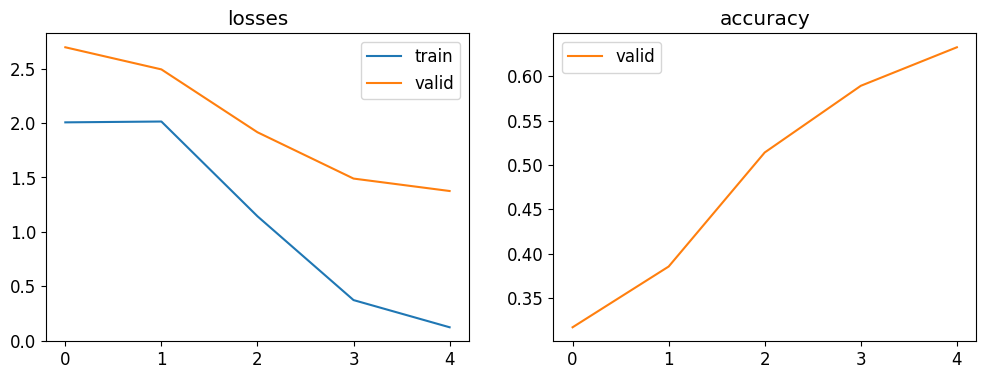


ACCURACY POR ÉPOCA en el conjunto VALIDATION:

	ÉPOCA 0 :  31.7195 %

	ÉPOCA 1 :  38.5643 %

	ÉPOCA 2 :  51.419 %

	ÉPOCA 3 :  58.9316 %

	ÉPOCA 4 :  63.2721 %

ACCURACY en el conjunto VALIDATION:  63.2721 %



Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                      

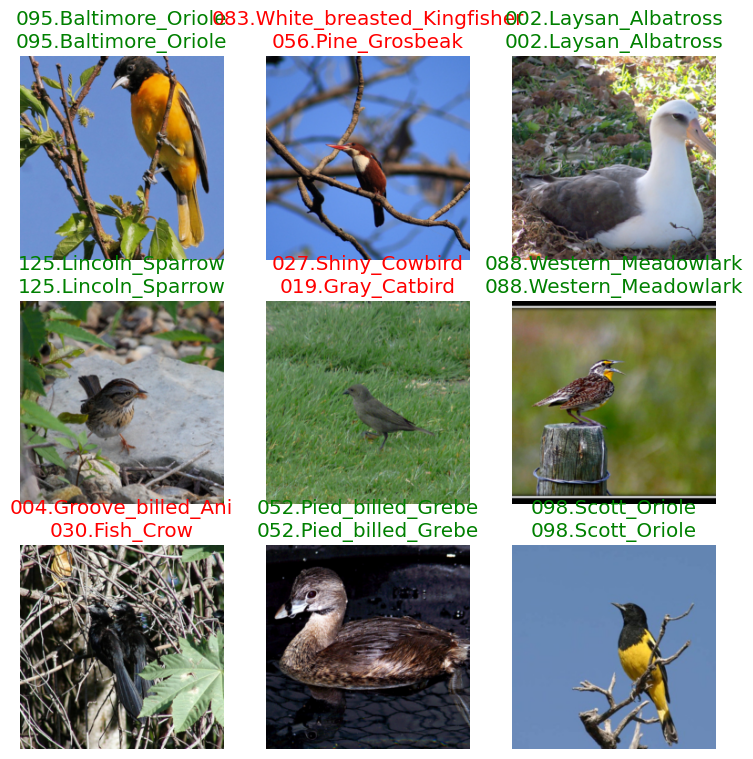

In [20]:
# Objeto Learner
learn = Learner(train_val_CUB_200_2011_dl, pretrained_modelResNet18, loss_func = CrossEntropyLossFlat(), metrics = accuracy)

# Fine-tuning
learn.fine_tune(epochs = 5)

# Mostrar la curva de accuracy en validación a lo largo de las diferentes épocas
learn.recorder.plot_metrics()

# Accuracy en el conjunto de validación
final_metrics_val = learn.recorder.values[-1] # Últimos valores de las métricas almacenados en el historial

print('\nACCURACY POR ÉPOCA en el conjunto VALIDATION:')
for i in range(len(learn.recorder.values)):
  epoch_metrics_val = learn.recorder.values[i]           # Valores de las métricas en la época correspondiente
  epoch_acc_val = epoch_metrics_val[-1]                  # Accuracy en validación en la época correspondiente
  print('\n\tÉPOCA', i, ': ', round(float(epoch_acc_val) * 100, 4), '%')

final_acc_val = final_metrics_val[-1]                    # Accuracy en validación de la última época de entrenamiento

print('\nACCURACY en el conjunto VALIDATION: ', round(float(final_acc_val) * 100, 4), '%\n')

# Mostrar resultados tras el entrenamiento del modelo
learn.show_results()

# Mostrar todos los detalles del objeto Learner
learn.summary()

In [21]:
# Generación de predicciones del modelo entrenado en el conjunto de entrenamiento
preds, targs, _ = learn.get_preds(dl = train_val_CUB_200_2011_dl.train, with_decoded = True)

# Accuracy en el conjunto de entrenamiento
acc_train = accuracy(preds, targs)
print('\nACCURACY en el conjunto TRAINING: ', round(float(acc_train) * 100, 4), '%')


ACCURACY en el conjunto TRAINING:  99.4439 %


In [22]:
# Definición del DataLoad para el conjunto de datos de prueba (test)
test_CUB_200_2011_dl = learn.dls.test_dl(files_test, with_labels = True)

# Generación de predicciones del modelo entrenado en el conjunto de test
preds, targs, _ = learn.get_preds(dl = test_CUB_200_2011_dl, with_decoded = True)

# Accuracy en el conjunto de test
acc_test = accuracy(preds, targs)
print('\nACCURACY en el conjunto TEST: ', round(float(acc_test) * 100, 4), '%')


ACCURACY en el conjunto TEST:  65.7232 %


Por el mismo motivo expuesto en 3.1.1, no mostramos la matriz de confusión.

### **3.2.1. Análisis de los resultados**


  - Loss en Training: 0.122375

  - Accuracy en Training: 0.988879

  - Loss en Validation: 1.375606

  - Accuracy en Validation: 0.632721

  - Accuracy en Test: 0.571108

  - La pérdida en el conjunto de entrenamiento es muy baja, y el accuracy es excepcionalmente alto, alcanzando el 98.89%. Esto sugiere que el modelo está memorizando efectivamente los ejemplos de entrenamiento, experimentando así overfitting.

  - Aunque la pérdida en el conjunto de validación es significativamente mayor que en el conjunto de entrenamiento, el accuracy es razonable, alcanzando el 63.27%. Este es un buen indicador de que el modelo está generalizando bien a datos no vistos, aunque hay una discrepancia entre el conjunto de entrenamiento y el conjunto de validación.

  - La discrepancia entre el accuracy en el conjunto de entrenamiento y validación sugiere que el modelo podría estar experimentando overfitting. Sin embargo, la brecha no es tan grande como en el modelo del apartado 3.1.3, lo que indica que el fine-tuning ha ayudado a mitigar el overfitting.

  - En términos de accuracy en el conjunto de validación, el fine-tuning ha mejorado considerablemente (un aumento del 8% aproximadamente) en comparación con los modelos del apartado 3.1. Además, la brecha entre el conjunto de entrenamiento y validación es menor en comparación con los modelos del apartado 3.1, lo que sugiere que el fine-tuning ha ayudado a reducir el overfitting.

## <font color='blue'>  3.3. Train from scratch the entire ResNet18 (including the suitable FC layer as output/head)

La razón por la cual se propone este ejercicio es comparar el rendimiento de entrenar un modelo desde cero con el rendimiento obtenido mediante fine-tuning en el apartado 3.2, donde se utilizó una red preentrenada (ResNet18) con pesos inicializados desde ImageNet y se ajustaron específicamente para la tarea de clasificación de aves.

Algunas consideraciones clave son las siguientes:

- Inicialización de pesos: Cuando se entrena desde cero, los pesos de la red se inicializan aleatoriamente. Esto puede llevar a un proceso de entrenamiento más lento y, en algunos casos, a quedarse atascado en mínimos locales subóptimos al principio.

- Necesidad de grandes conjuntos de datos: Entrenar una red neuronal desde cero generalmente requiere conjuntos de datos grandes para que el modelo pueda aprender patrones representativos. En comparación, el fine-tuning con un modelo preentrenado aprovecha los conocimientos previos adquiridos en tareas relacionadas, como ImageNet, pudiéndose aplicar dicho modelo preentrenado a tareas que utilizan datasets más pequeños (como es nuestro caso).

- Transfer learning: Fine-tuning aprovecha la transferencia de conocimiento al comenzar con un modelo preentrenado en una tarea relacionada y ajustar sus pesos para la tarea específica. Esto a menudo resulta en una convergencia más rápida y mejores resultados con menos datos.

- Tiempo de Entrenamiento: Entrenar desde cero generalmente requiere más tiempo de cómputo y recursos de entrenamiento que el fine-tuning, ya que cada peso de la red se ajusta completamente durante el entrenamiento.

En resumen, la idea principal detrás de este ejercicio es demostrar que, en muchos casos, es más beneficioso y eficiente utilizar el fine-tuning con modelos preentrenados en lugar de entrenar desde cero. Fine-tuning permite aprovechar los conocimientos aprendidos en conjuntos de datos más grandes y generalizar mejor a nuevas tareas con menos datos.

LEARNING RATE: 0.0002754228771664202 



epoch,train_loss,valid_loss,accuracy,time
0,5.347561,5.919811,0.025042,00:47
1,4.876137,5.888636,0.025042,00:49
2,4.396645,4.448999,0.088481,00:41
3,3.930219,4.077859,0.085142,00:46
4,3.407761,3.737997,0.153589,00:43
5,3.063473,3.685457,0.165275,00:43


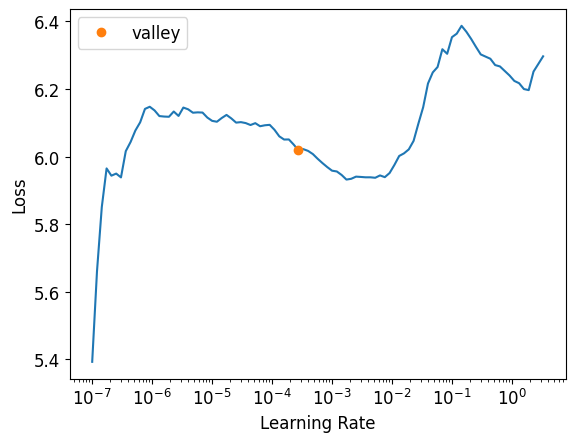

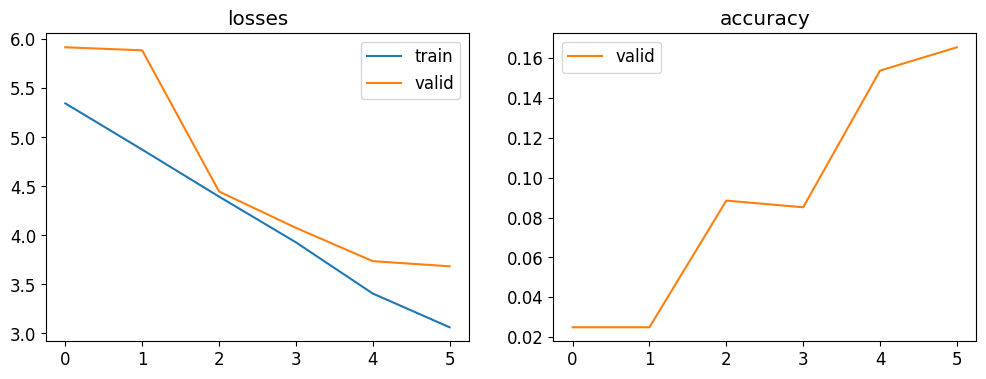


ACCURACY POR ÉPOCA en el conjunto VALIDATION:

	ÉPOCA 0 :  2.5042 %

	ÉPOCA 1 :  2.5042 %

	ÉPOCA 2 :  8.8481 %

	ÉPOCA 3 :  8.5142 %

	ÉPOCA 4 :  15.3589 %

	ÉPOCA 5 :  16.5275 %

ACCURACY en el conjunto VALIDATION:  16.5275 %



Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                      

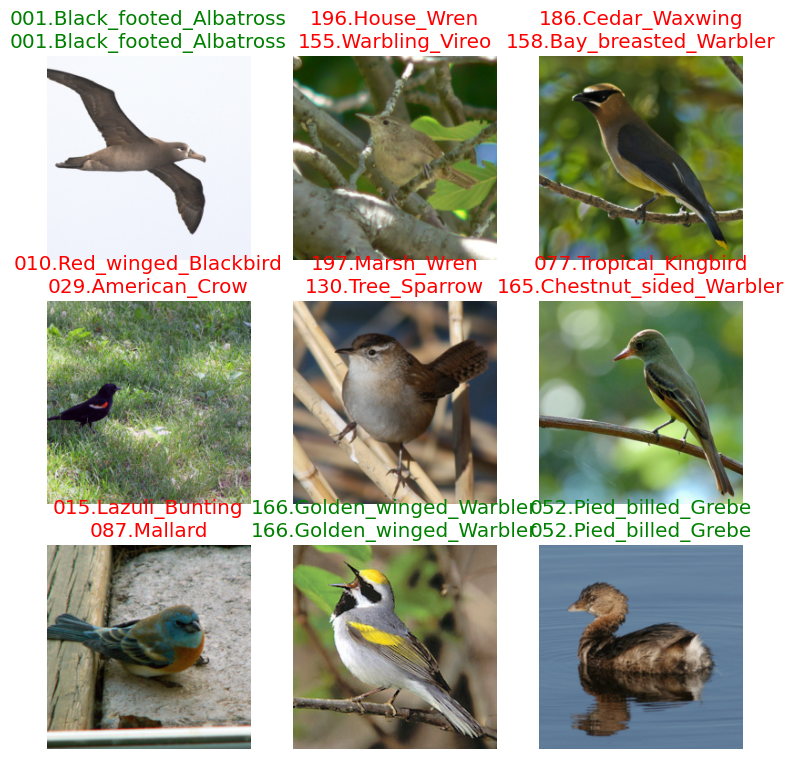

In [23]:
# Nuevo head (capa fully-connected con dimensionalidad adaptada a nuestro problema)
custom_head = sequential(
    nn.AdaptiveAvgPool2d(output_size = (1, 1)),
    nn.Flatten(),
    nn.Linear(in_features = 512, out_features = num_classes)
)

# Objeto vision_learner (por defecto, pretrained = True, así que lo cambiamos a False para entrenarlo desde cero)
learn = vision_learner(train_val_CUB_200_2011_dl, models.resnet18, pretrained = False, loss_func = CrossEntropyLossFlat(), metrics = accuracy, train_bn = False, custom_head = custom_head)

# Encontrar el valor óptimo del learning rate (lr)
lr = learn.lr_find()
print(f'LEARNING RATE: {lr[0]} \n')

# Ejecutar el optimizador one-cycle
learn.fit_one_cycle(n_epoch = 6, lr_max = lr[0])

# Mostrar la curva de accuracy en validación a lo largo de las diferentes épocas
learn.recorder.plot_metrics()

# Accuracy en el conjunto de validación
final_metrics_val = learn.recorder.values[-1] # Últimos valores de las métricas almacenados en el historial

print('\nACCURACY POR ÉPOCA en el conjunto VALIDATION:')
for i in range(len(learn.recorder.values)):
  epoch_metrics_val = learn.recorder.values[i]           # Valores de las métricas en la época correspondiente
  epoch_acc_val = epoch_metrics_val[-1]                  # Accuracy en validación en la época correspondiente
  print('\n\tÉPOCA', i, ': ', round(float(epoch_acc_val) * 100, 4), '%')

final_acc_val = final_metrics_val[-1]                    # Accuracy en validación de la última época de entrenamiento

print('\nACCURACY en el conjunto VALIDATION: ', round(float(final_acc_val) * 100, 4), '%\n')

# Mostrar resultados tras el entrenamiento del modelo
learn.show_results()

# Mostrar todos los detalles del objeto vision_learner
learn.summary()

In [24]:
# Generación de predicciones del modelo entrenado en el conjunto de entrenamiento
preds, targs, _ = learn.get_preds(dl = train_val_CUB_200_2011_dl.train, with_decoded = True)

# Accuracy en el conjunto de entrenamiento
acc_train = accuracy(preds, targs)
print('\nACCURACY en el conjunto TRAINING: ', round(float(acc_train) * 100, 4), '%')


ACCURACY en el conjunto TRAINING:  35.0139 %


In [25]:
# Definición del DataLoad para el conjunto de datos de prueba (test)
test_CUB_200_2011_dl = learn.dls.test_dl(files_test, with_labels = True)

# Generación de predicciones del modelo entrenado en el conjunto de test
preds, targs, _ = learn.get_preds(dl = test_CUB_200_2011_dl, with_decoded = True)

# Accuracy en el conjunto de test
acc_test = accuracy(preds, targs)
print('\nACCURACY en el conjunto TEST: ', round(float(acc_test) * 100, 4), '%')


ACCURACY en el conjunto TEST:  16.776 %


Por el mismo motivo expuesto en 3.1.1, no mostramos la matriz de confusión.

### **3.3.1. Análisis de los resultados**

  - Loss en Training: 3.063473

  - Accuracy en Training: 0.350139

  - Loss en Validation: 3,685457

  - Accuracy en Validation: 0.165275

  - Accuracy en Test: 0.16776

Los resultados obtenidos al entrenar el modelo desde cero muestran algunas diferencias significativas en comparación con los resultados del fine-tuning. Realizamos un análisis comparativo:

- La precisión en el conjunto de validación después del fine-tuning fue de aproximadamente 63.27%, mientras que al entrenar desde cero, la precisión en el conjunto de validación es solo del 16.53%. Por tanto, el fine-tuning supera claramente al entrenamiento desde cero en términos de rendimiento en este dataset específico, además de converger más rápido.

- Se puede observar que el tiempo por época durante el fine-tuning fue  alrededor de 43-46 segundos por época, mientras que el tiempo por época para el entrenamiento desde cero es un poco mayor, alrededor de 41-49 segundos por época (tampoco demasiado, debido a que el dataset con el que tratamos no tiene un gran tamaño). En general, el entrenamiento desde cero requiere más tiempo de cómputo en cada época en comparación con el fine-tuning.

- El fine-tuning demostró una capacidad de generalización significativamente mejor, con una precisión en el conjunto de prueba del 57.11%. Por otro lado, la precisión en el conjunto de prueba después del entrenamiento desde cero es del 16.77%, lo que sugiere una capacidad de generalización limitada. En conclusión, el fine-tuning generaliza mejor a nuevos datos, lo que respalda la idea de que los modelos preentrenados tienen una ventaja en términos de transferencia de conocimientos.

En resumen, los resultados respaldan la idea de que, en general, es preferible utilizar el fine-tuning con modelos preentrenados en lugar de entrenar desde cero, especialmente cuando se dispone de conjuntos de datos más pequeños. El fine-tuning permite aprovechar los conocimientos previos y generaliza mejor a nuevas tareas. En este caso específico, los resultados del fine-tuning superan significativamente al entrenamiento desde cero en términos de rendimiento y eficiencia.

Pueden consultarse los siguientes enlaces interesantes:

[9] https://fritz.ai/pre-trained-machine-learning-models-vs-models-trained-from-scratch/

[10] https://github.com/ultralytics/ultralytics/issues/1786